In [ ]:
from matplotlib import pyplot as plt
from PIL import Image
import torchvision
import numpy as np
import shutil
import random
import torch
import os

%matplotlib inline

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.9.0+cu102


In [ ]:
import pandas as pd

In [ ]:
import random
import glob # borrar ficheros con patrones
import shutil #copiar ficheros

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit #para realizar el muestre

In [ ]:
!wget --no-check-certificate \
    https://www.recod.ic.unicamp.br/~aurea.soriano/dataset/covid19.zip \
    -O /tmp/covid19.zip

--2021-08-07 17:11:57--  https://www.recod.ic.unicamp.br/~aurea.soriano/dataset/covid19.zip
Resolving www.recod.ic.unicamp.br (www.recod.ic.unicamp.br)... 143.106.7.142
Connecting to www.recod.ic.unicamp.br (www.recod.ic.unicamp.br)|143.106.7.142|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: http://intranet.recod.ic.unicamp.br/~aurea.soriano/dataset/covid19.zip [following]
--2021-08-07 17:11:58--  http://intranet.recod.ic.unicamp.br/~aurea.soriano/dataset/covid19.zip
Resolving intranet.recod.ic.unicamp.br (intranet.recod.ic.unicamp.br)... 143.106.7.151
Connecting to intranet.recod.ic.unicamp.br (intranet.recod.ic.unicamp.br)|143.106.7.151|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 780769059 (745M) [application/zip]
Saving to: ‘/tmp/covid19.zip’

/tmp/covid19.zip    100%[===================>] 744.60M  20.2MB/s    in 38s     

2021-08-07 17:12:37 (19.7 MB/s) - ‘/tmp/covid19.zip’ saved [780769059/780769059]



In [ ]:
import zipfile

local_zip = '/tmp/covid19.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

In [ ]:
#ruta donde se descomprimen los fichereros del dataset
os.listdir("/tmp/COVID-19_Radiography_Dataset")

['Viral Pneumonia.metadata.xlsx',
 'Viral Pneumonia',
 'Lung_Opacity.metadata.xlsx',
 'Normal',
 'COVID',
 'Lung_Opacity',
 'Normal.metadata.xlsx',
 'README.md.txt',
 'COVID.metadata.xlsx']

['COVID',
 'COVID.metadata.xlsx',
 'Lung_Opacity',
 'Lung_Opacity.metadata.xlsx',
 'Normal',
 'Normal.metadata.xlsx',
 'README.md.txt',
 'Viral Pneumonia',
 'Viral Pneumonia.metadata.xlsx']

In [ ]:
#removemos los ficheros que no usaremos 
py_files = glob.glob('/tmp/COVID-19_Radiography_Dataset/*.*')
for py_file in py_files:
    try:
        os.remove(py_file)
    except OSError as e:
        print(f"Error:{ e.strerror}")

In [ ]:
root_dir    = '/tmp/COVID-19_Radiography_Dataset' #directorio origen

os.listdir(root_dir)

['Viral Pneumonia', 'Normal', 'COVID', 'Lung_Opacity']

In [ ]:
class_names = ['normal','opacity', 'viral', 'covid']
source_dirs = ['Normal','Lung_Opacity','Viral Pneumonia', 'COVID']

In [ ]:
for i, d in enumerate(source_dirs):
    os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

In [ ]:
os.listdir(root_dir)

['opacity', 'covid', 'normal', 'viral']

In [ ]:
#dataframe de las imagenes y clases
list_files=[]
for dir in os.listdir(root_dir):
  directory = os.path.join(root_dir,dir) # directorios de las clases
  if os.path.isdir(directory):
    for img in os.listdir(directory):
      list_files.append([os.path.join(dir,img),dir]) #lista de todos los ficheros de cada directorio
df = pd.DataFrame(list_files, columns=['id','clase'])

In [ ]:
df

,id,clase
0,opacity/Lung_Opacity-4965.png,opacity
1,opacity/Lung_Opacity-166.png,opacity
2,opacity/Lung_Opacity-3229.png,opacity
3,opacity/Lung_Opacity-1.png,opacity
4,opacity/Lung_Opacity-1440.png,opacity
...,...,...
21160,viral/Viral Pneumonia-643.png,viral
21161,viral/Viral Pneumonia-212.png,viral
21162,viral/Viral Pneumonia-953.png,viral
21163,viral/Viral Pneumonia-151.png,viral


In [ ]:
df.groupby("clase").agg(frequency=("clase", "count"))

,frequency
clase,
covid,3616
normal,10192
opacity,6012
viral,1345


In [ ]:
df["clase"].unique()

array(['opacity', 'covid', 'normal', 'viral'], dtype=object)

In [ ]:
#Haremos un submuestreo a las clases con mas ejemplos que la clase COVID
def balance_dataset(focus_class, df):
  classes = df["clase"].unique()
  classes_df_list = []
  focus_class_df = df[df["clase"] == focus_class]
  classes_df_list.append(focus_class_df)
  count_focus_class = len(focus_class_df)
  ##Dividimos por clases
  for classe in classes:
    class_df = df[df["clase"] == classe]
    count_class = len(class_df)
    if classe == focus_class:
      continue
    if count_class > count_focus_class+1000:
      class_df = class_df.sample(count_focus_class+1000)
    classes_df_list.append(class_df)
  df_under = pd.concat(classes_df_list, axis=0) 
  return df_under


df = balance_dataset('covid',df)

In [ ]:
df.groupby("clase").agg(frequency=("clase", "count"))

,frequency
clase,
covid,3616
normal,4616
opacity,4616
viral,1345


In [ ]:
root_dir

'/tmp/COVID-19_Radiography_Dataset'

In [ ]:
os.mkdir(root_dir+"/train")
os.mkdir(root_dir+"/test")


os.mkdir(root_dir+"/train/covid")
os.mkdir(root_dir+"/test/covid")

os.mkdir(root_dir+"/train/viral")
os.mkdir(root_dir+"/test/viral")

os.mkdir(root_dir+"/train/normal")
os.mkdir(root_dir+"/test/normal")

os.mkdir(root_dir+"/train/opacity")
os.mkdir(root_dir+"/test/opacity")


In [ ]:
#creamos la función que hará el split de nuestros conjuntos
def split_dataset(df,test_size,random_state = 101):
  sss = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)#se divide de forma stratificada
  df = df.reset_index()
  for train_index, test_index in sss.split(df['id'], df['clase']):
    X_train, X_test = df['id'][train_index], df['id'][test_index]
    y_train, y_test = df['clase'][train_index], df['clase'][test_index]
  traindf = pd.concat([X_train, y_train], axis=1)
  testdf = pd.concat([X_test, y_test], axis=1)
  return traindf,testdf

In [ ]:
traindf,testdf = split_dataset(df,test_size = 0.10)

In [ ]:
print(traindf['clase'].value_counts())

normal     9173
opacity    5411
covid      3254
viral      1210
Name: clase, dtype: int64


In [ ]:
print(testdf['clase'].value_counts())


normal     1019
opacity     601
covid       362
viral       135
Name: clase, dtype: int64


In [ ]:
#visualizamos que todos nuestros conjuntos tienen imagenes diferentes entre ellos 
repetidos=pd.merge(traindf,testdf,how='left',on=['id'])
print(repetidos['clase_y'].unique())


[nan]


In [ ]:
for i in traindf.index:
  shutil.copy(root_dir+"/"+traindf['id'][i],  root_dir+"/train/"+traindf['clase'][i])

In [ ]:
for i in testdf.index:
  shutil.copy(root_dir+"/"+testdf['id'][i],  root_dir+"/test/"+testdf['clase'][i])

In [ ]:
#conteo de ficheros en la clase train
tmp=0
print("Cantidad de datos en Train")
for i in traindf["clase"].unique():
  train=len(os.listdir("/tmp/COVID-19_Radiography_Dataset/train/"+i))
  print(i,str(train))
  tmp=tmp+train
print("Ficheros en Train: "+str(tmp))

Cantidad de datos en Train
normal 9173
covid 3254
viral 1210
opacity 5411
Ficheros en Train: 19048


In [ ]:
#conteo de ficheros en la clase test
tmp=0
print("Cantidad de ficheros en Test")
for i in testdf["clase"].unique():
  test=len(os.listdir("/tmp/COVID-19_Radiography_Dataset/test/"+i))
  print(i,str(test))
  tmp=tmp+test
print("ficheros en Test "+str(tmp))

Cantidad de ficheros en Test
viral 135
normal 1019
covid 362
opacity 601
ficheros en Test 2117


# Creating Custom Dataset

In [ ]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name): #Verificar se o aquivo realmente é imagem 'png'
            images = [x for x in os.listdir(image_dirs[class_name]) if x.lower().endswith('png')] 
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = ['normal', 'viral', 'covid','opacity']
        
        for c in self.class_names:
            self.images[c] = get_images(c)
            
        self.image_dirs = image_dirs
        self.transform = transform
          
    def __len__(self):
        return sum([len(self.images[c]) for c in self.class_names])
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index%len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

# Image Transformations

In [ ]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size = (224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

In [ ]:
test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size = (224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Prepare Loader

In [ ]:
train_dirs = {
    'normal': '/tmp/COVID-19_Radiography_Dataset/train/normal',
    'viral': '/tmp/COVID-19_Radiography_Dataset/train/viral',
    'covid': '/tmp/COVID-19_Radiography_Dataset/train/covid',
    'opacity': '/tmp/COVID-19_Radiography_Dataset/train/opacity'
}

In [ ]:
test_dirs = {
    'normal': '/tmp/COVID-19_Radiography_Dataset/test/normal',
    'viral': '/tmp/COVID-19_Radiography_Dataset/test/viral',
    'covid': '/tmp/COVID-19_Radiography_Dataset/test/covid',
    'opacity': '/tmp/COVID-19_Radiography_Dataset/test/opacity'
}

In [ ]:
train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 9173 normal examples
Found 1210 viral examples
Found 3254 covid examples
Found 5411 opacity examples


In [ ]:
test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 1019 normal examples
Found 135 viral examples
Found 362 covid examples
Found 601 opacity examples


In [ ]:
batch_size_train = 12
batch_size_test = 6

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size_train, shuffle = True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size = batch_size_test, shuffle = True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 1588
Number of test batches 353


In [ ]:
class_names = ['normal','viral','covid','opacity']

def show_images(images, labels, preds):
    plt.figure(figsize=(16, 9))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks = [], yticks = [])
        image = image.numpy().transpose((1, 2, 0))
        mean  = np.array([0.485, 0.456, 0.406])
        std   = np.array([0.229, 0.224, 0.225])
        image = image*std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col   = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color = col)
    plt.tight_layout()
    plt.show()

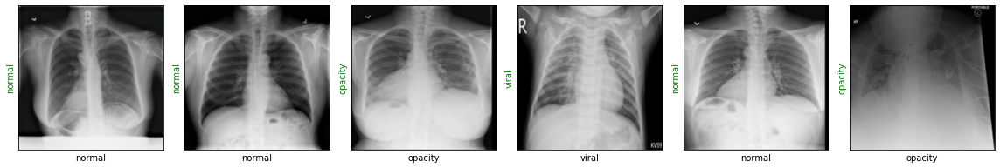

In [ ]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

# Creating the Model

In [ ]:
resnet18 = torchvision.models.resnet18(pretrained = True)

print(resnet18)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
 

In [ ]:
resnet18.fc = torch.nn.Linear(in_features = 512, out_features = 4)
loss_fn     = torch.nn.CrossEntropyLoss()
optimizer   = torch.optim.Adam(resnet18.parameters(), lr = 3e-5)

In [ ]:
def show_preds():
    resnet18.eval()
    images, labels = next(iter(dl_test))
    outputs  = resnet18(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


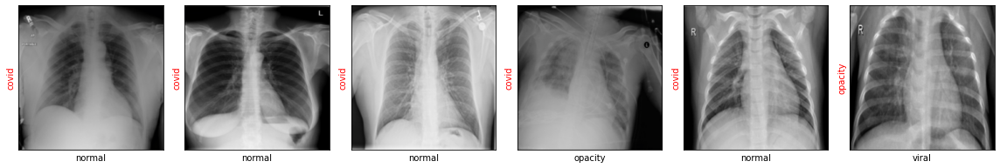

In [ ]:
show_preds()

In [ ]:
def train(epochs):
    print('Starting training..')
    train_losses, test_losses = [], []
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        resnet18.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                train_loss /= (train_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                train_losses.append(train_loss/len(dl_train))
                test_losses.append(val_loss/len(dl_test))

                show_preds()

                resnet18.train()

                if accuracy >= 0.95:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/2
Evaluating at step 0
Validation Loss: 0.8232, Accuracy: 0.7270


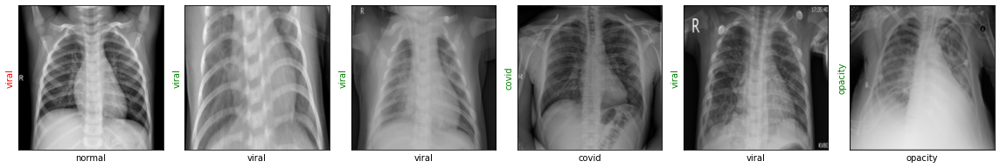

Evaluating at step 20
Validation Loss: 0.6146, Accuracy: 0.7860


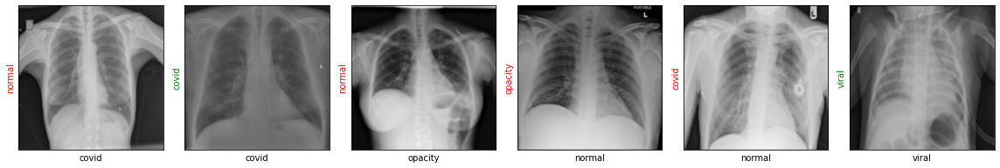

Evaluating at step 40
Validation Loss: 0.5095, Accuracy: 0.8238


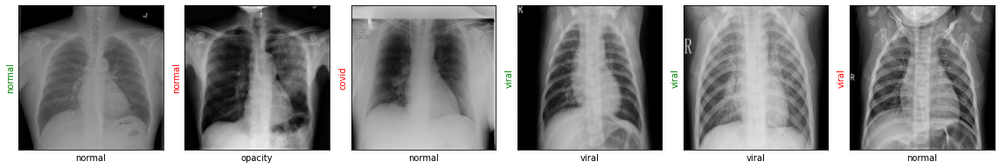

Evaluating at step 60
Validation Loss: 0.4501, Accuracy: 0.8342


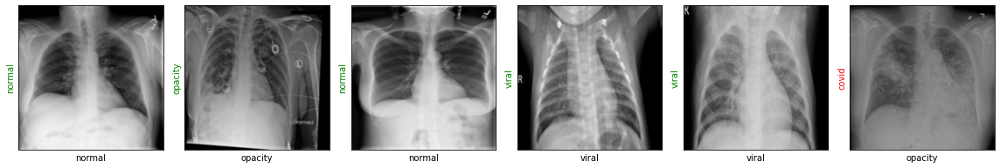

Evaluating at step 80
Validation Loss: 0.4276, Accuracy: 0.8493


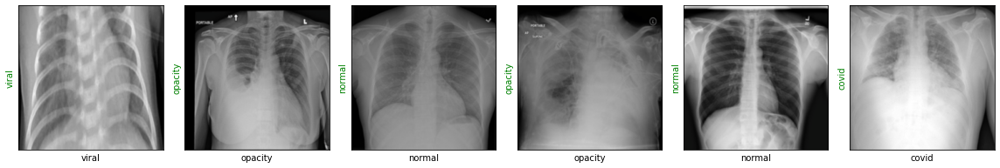

Evaluating at step 100
Validation Loss: 0.3940, Accuracy: 0.8630


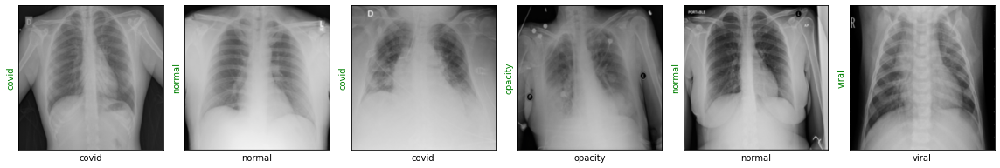

Evaluating at step 120
Validation Loss: 0.3527, Accuracy: 0.8710


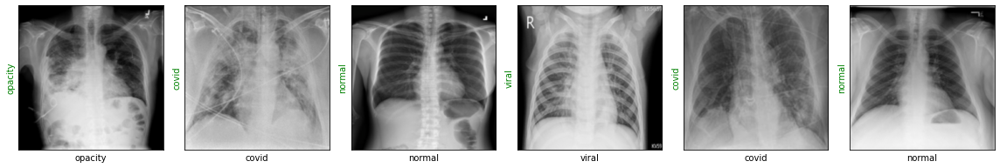

Evaluating at step 140
Validation Loss: 0.3395, Accuracy: 0.8795


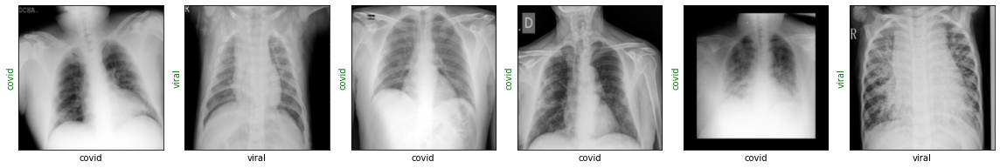

Evaluating at step 160
Validation Loss: 0.3202, Accuracy: 0.8800


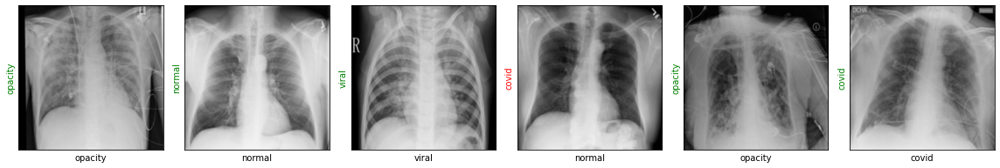

Evaluating at step 180
Validation Loss: 0.3160, Accuracy: 0.8824


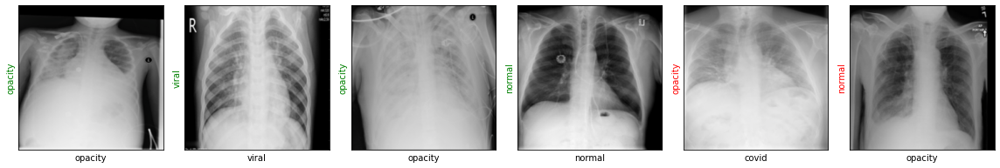

Evaluating at step 200
Validation Loss: 0.2925, Accuracy: 0.9027


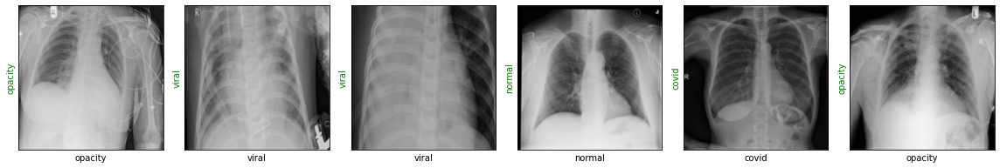

Evaluating at step 220
Validation Loss: 0.2710, Accuracy: 0.9060


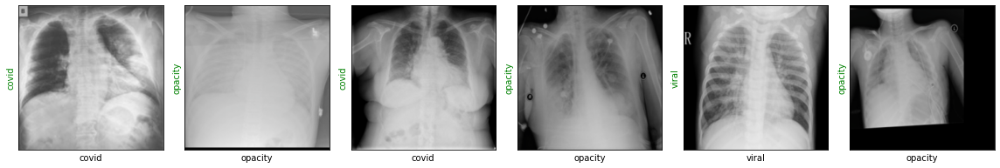

Evaluating at step 240
Validation Loss: 0.2648, Accuracy: 0.8984


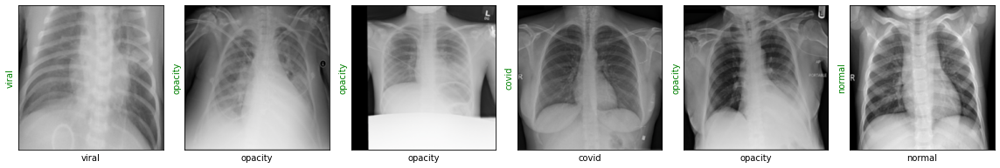

Evaluating at step 260
Validation Loss: 0.2361, Accuracy: 0.9145


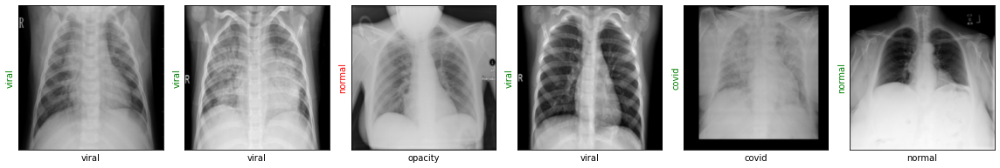

Evaluating at step 280
Validation Loss: 0.2213, Accuracy: 0.9202


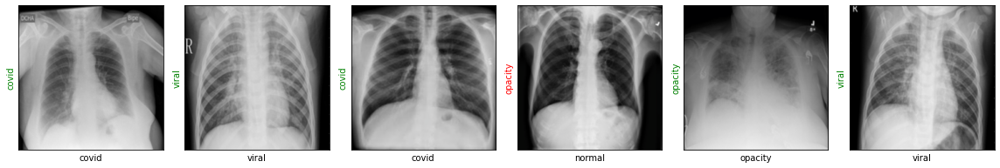

Evaluating at step 300
Validation Loss: 0.2640, Accuracy: 0.9022


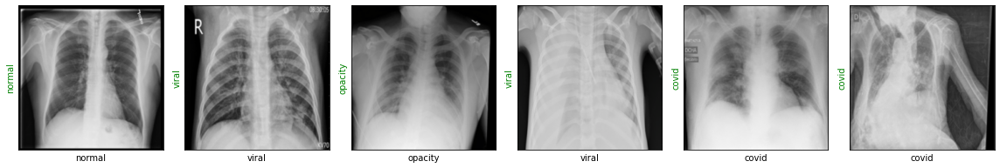

Evaluating at step 320
Validation Loss: 0.2265, Accuracy: 0.9169


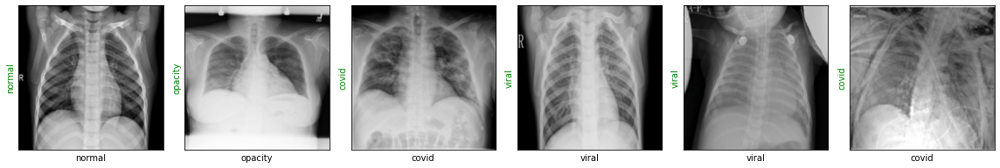

Evaluating at step 340
Validation Loss: 0.2092, Accuracy: 0.9249


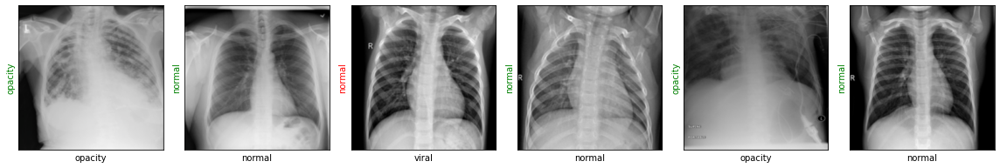

Evaluating at step 360
Validation Loss: 0.2352, Accuracy: 0.9145


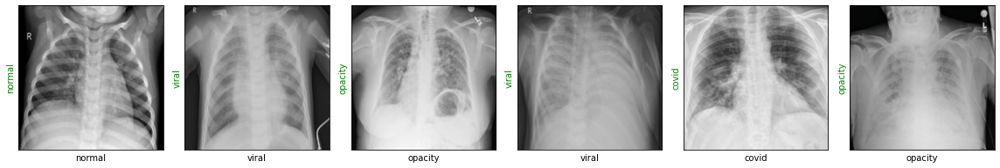

Evaluating at step 380
Validation Loss: 0.1930, Accuracy: 0.9277


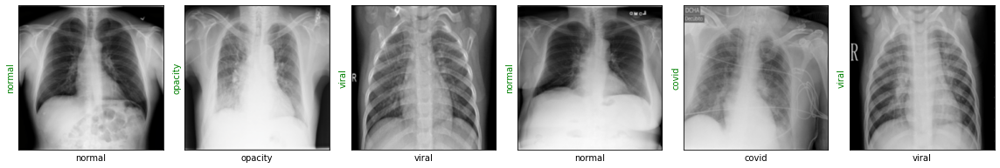

Evaluating at step 400
Validation Loss: 0.2091, Accuracy: 0.9216


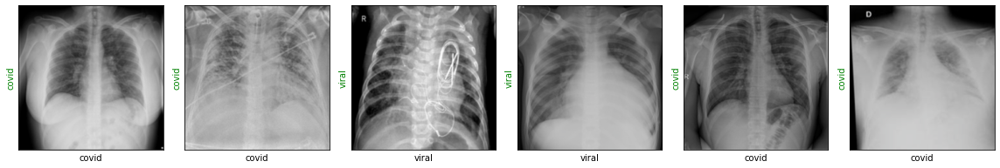

Evaluating at step 420
Validation Loss: 0.2107, Accuracy: 0.9140


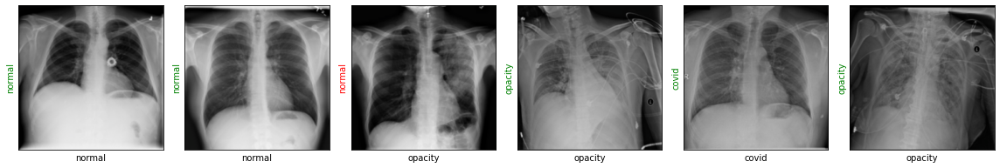

Evaluating at step 440
Validation Loss: 0.2178, Accuracy: 0.9202


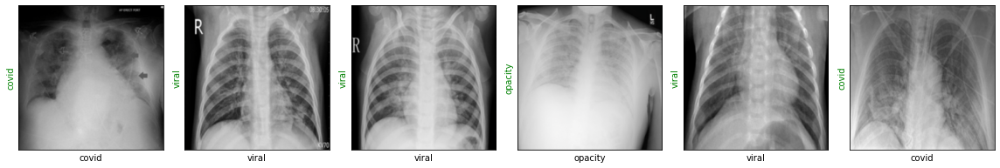

Evaluating at step 460
Validation Loss: 0.2152, Accuracy: 0.9249


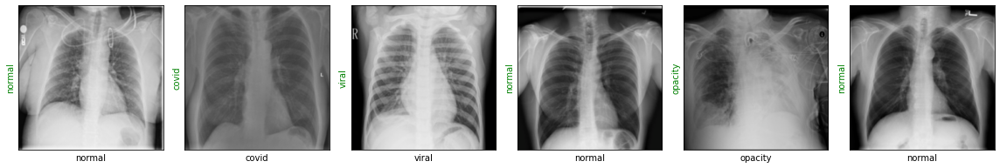

Evaluating at step 480
Validation Loss: 0.1851, Accuracy: 0.9325


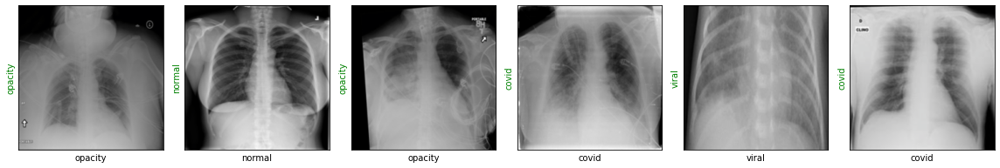

Evaluating at step 500
Validation Loss: 0.1934, Accuracy: 0.9310


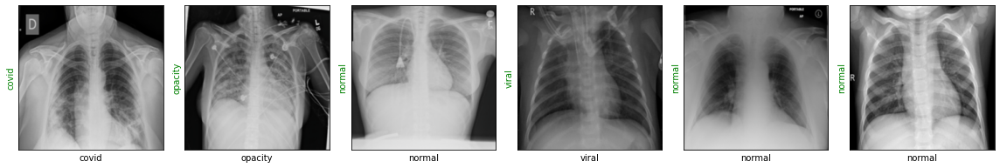

Evaluating at step 520
Validation Loss: 0.1837, Accuracy: 0.9405


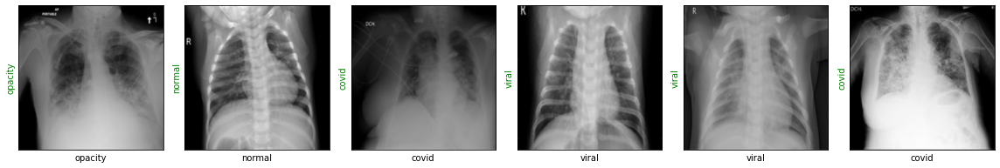

Evaluating at step 540
Validation Loss: 0.1934, Accuracy: 0.9362


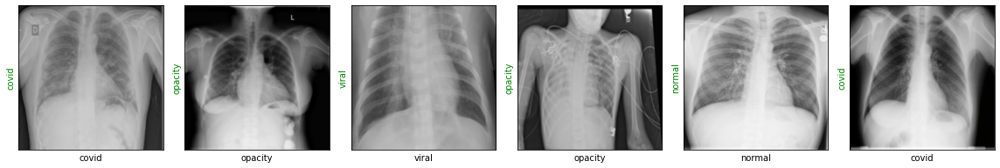

Evaluating at step 560
Validation Loss: 0.1861, Accuracy: 0.9353


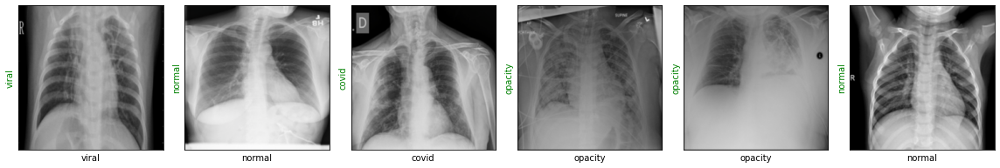

Evaluating at step 580
Validation Loss: 0.1825, Accuracy: 0.9358


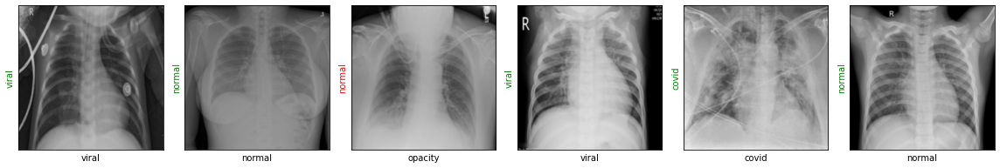

Evaluating at step 600
Validation Loss: 0.1895, Accuracy: 0.9353


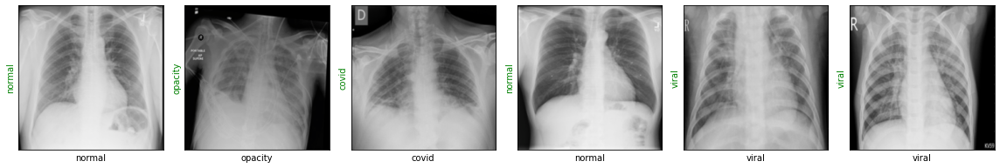

Evaluating at step 620
Validation Loss: 0.1770, Accuracy: 0.9358


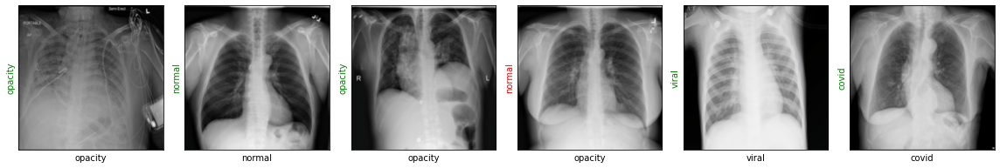

Evaluating at step 640
Validation Loss: 0.1775, Accuracy: 0.9348


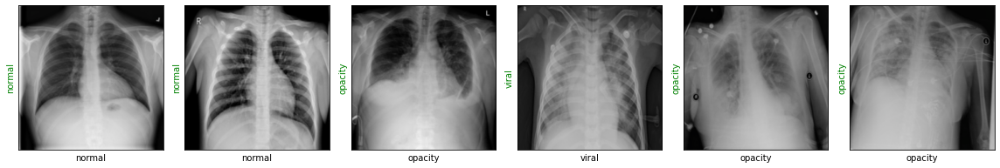

Evaluating at step 660
Validation Loss: 0.1907, Accuracy: 0.9230


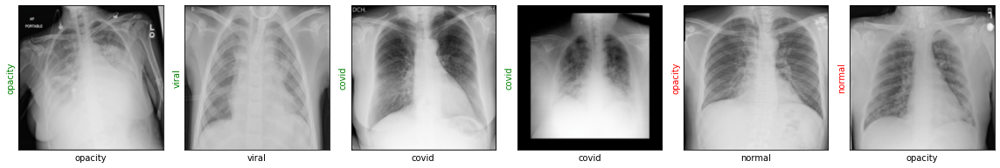

Evaluating at step 680
Validation Loss: 0.1609, Accuracy: 0.9485


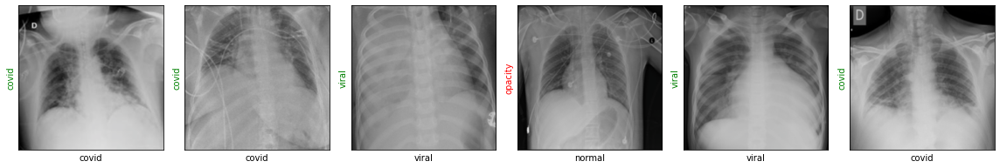

Evaluating at step 700
Validation Loss: 0.1849, Accuracy: 0.9315


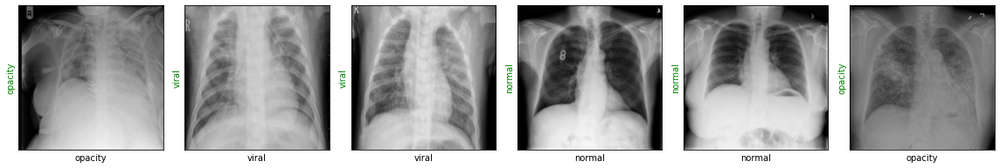

Evaluating at step 720
Validation Loss: 0.1664, Accuracy: 0.9400


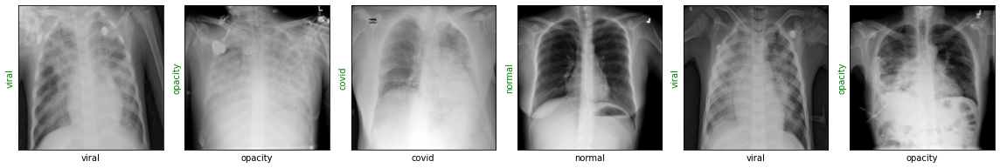

Evaluating at step 740
Validation Loss: 0.1777, Accuracy: 0.9376


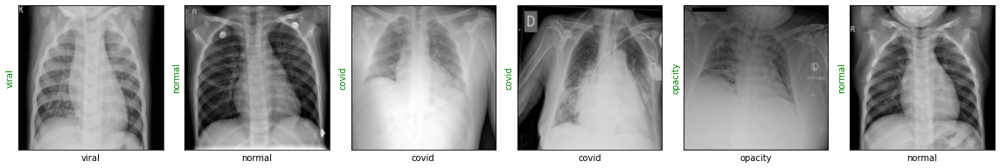

Evaluating at step 760
Validation Loss: 0.1861, Accuracy: 0.9329


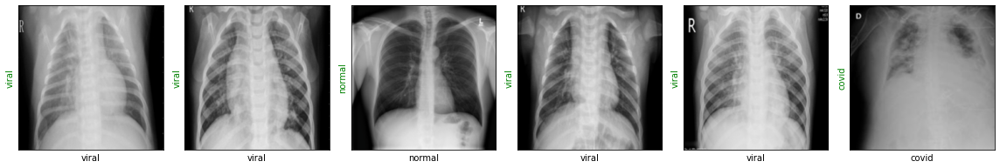

Evaluating at step 780
Validation Loss: 0.1898, Accuracy: 0.9254


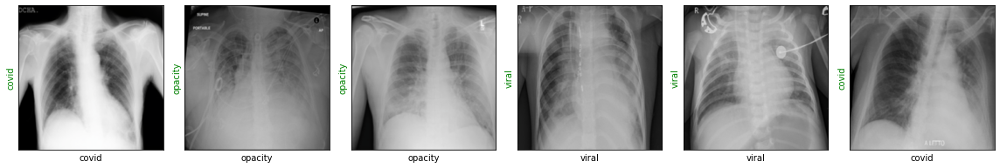

Evaluating at step 800
Validation Loss: 0.1772, Accuracy: 0.9438


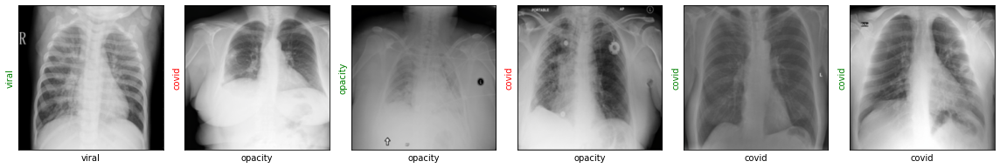

Evaluating at step 820
Validation Loss: 0.1608, Accuracy: 0.9466


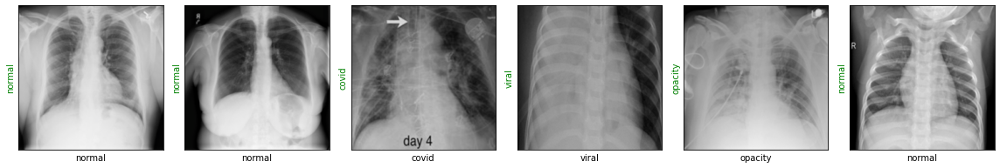

Evaluating at step 840
Validation Loss: 0.1688, Accuracy: 0.9329


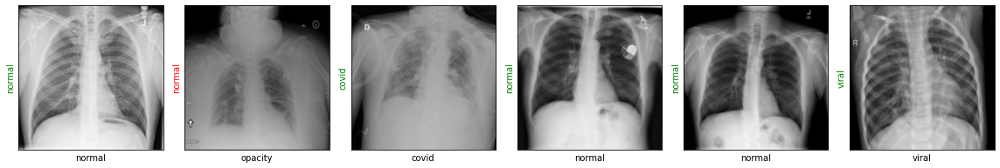

Evaluating at step 860
Validation Loss: 0.1802, Accuracy: 0.9400


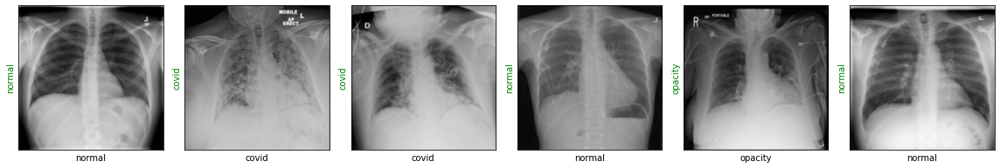

Evaluating at step 880
Validation Loss: 0.1618, Accuracy: 0.9428


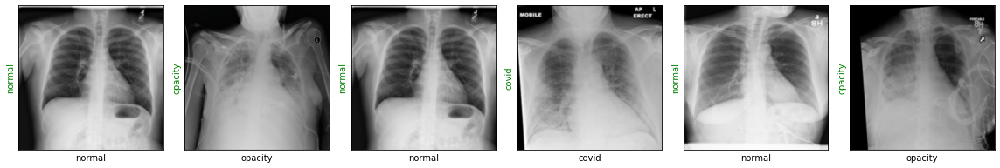

Evaluating at step 900
Validation Loss: 0.1668, Accuracy: 0.9405


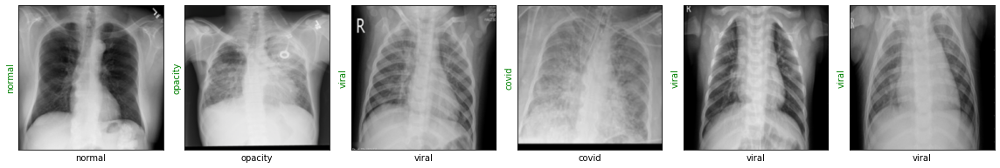

Evaluating at step 920
Validation Loss: 0.1717, Accuracy: 0.9372


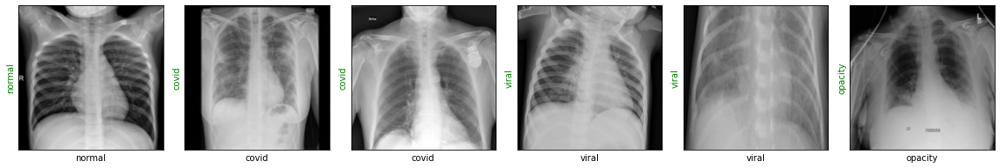

Evaluating at step 940
Validation Loss: 0.1941, Accuracy: 0.9296


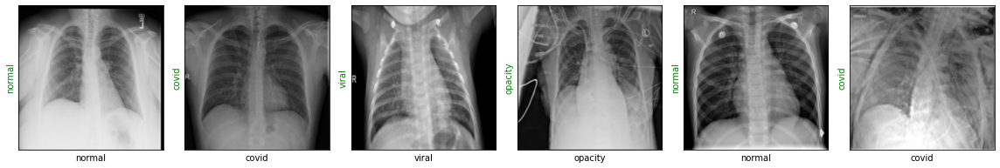

Evaluating at step 960
Validation Loss: 0.1619, Accuracy: 0.9433


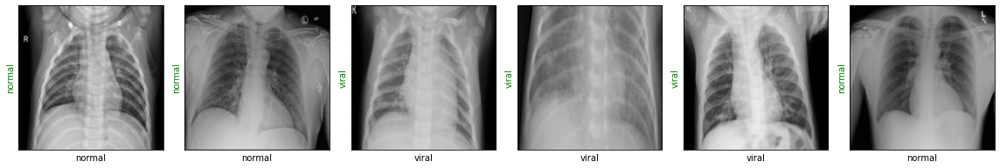

Evaluating at step 980
Validation Loss: 0.1503, Accuracy: 0.9424


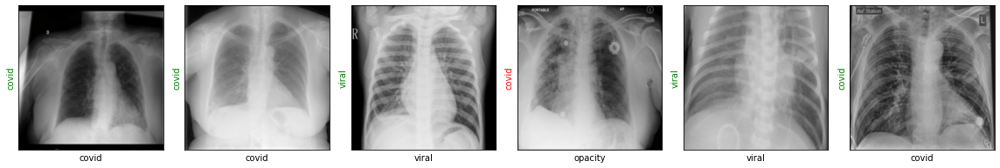

Evaluating at step 1000
Validation Loss: 0.1686, Accuracy: 0.9306


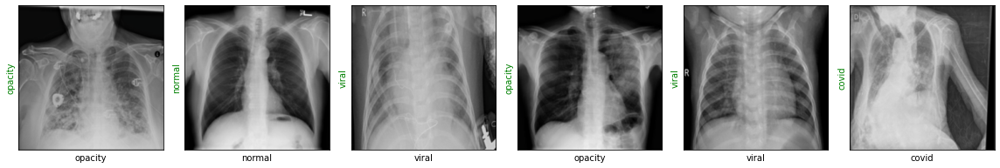

Evaluating at step 1020
Validation Loss: 0.1429, Accuracy: 0.9466


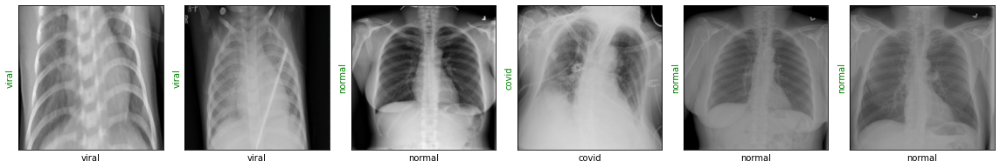

Evaluating at step 1040
Validation Loss: 0.1849, Accuracy: 0.9301


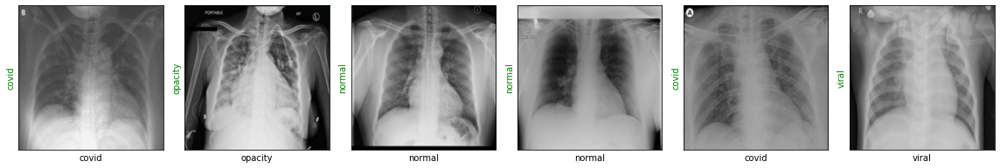

Evaluating at step 1060
Validation Loss: 0.1652, Accuracy: 0.9433


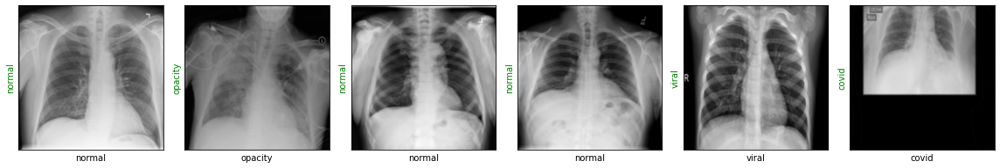

Evaluating at step 1080
Validation Loss: 0.1457, Accuracy: 0.9443


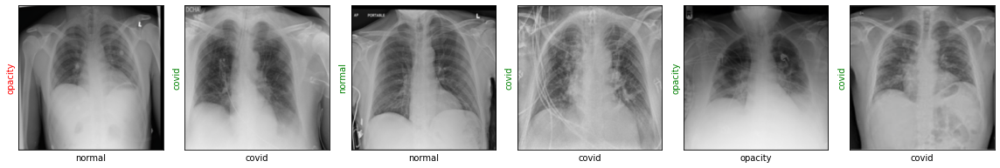

Evaluating at step 1100
Validation Loss: 0.1618, Accuracy: 0.9372


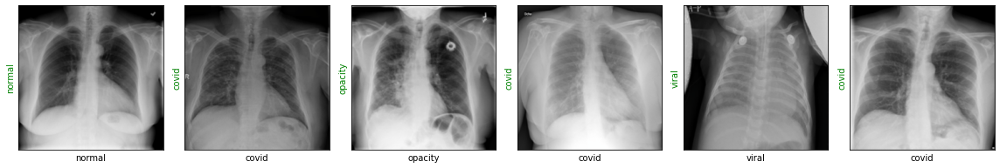

Evaluating at step 1120
Validation Loss: 0.1418, Accuracy: 0.9462


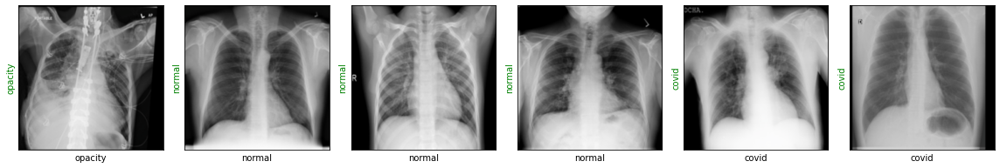

Evaluating at step 1140
Validation Loss: 0.1794, Accuracy: 0.9386


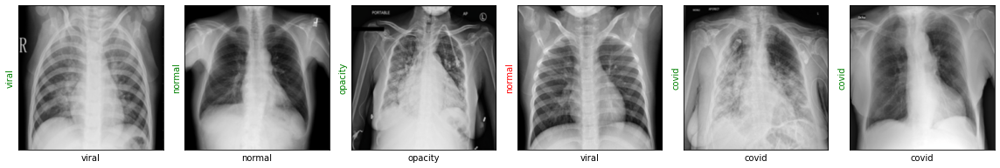

Evaluating at step 1160
Validation Loss: 0.1383, Accuracy: 0.9428


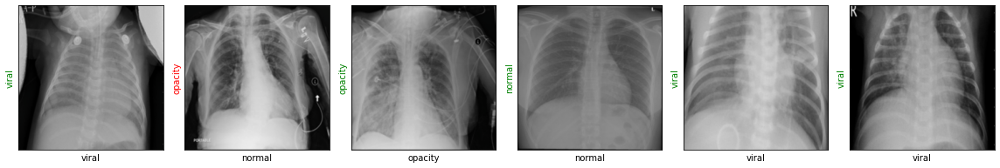

Evaluating at step 1180
Validation Loss: 0.1674, Accuracy: 0.9334


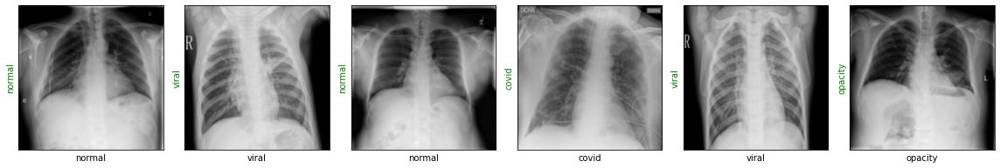

Evaluating at step 1200
Validation Loss: 0.1617, Accuracy: 0.9381


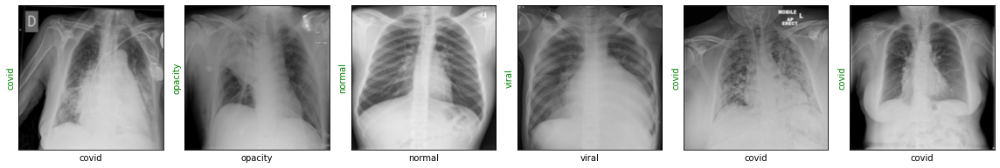

Evaluating at step 1220
Validation Loss: 0.1629, Accuracy: 0.9362


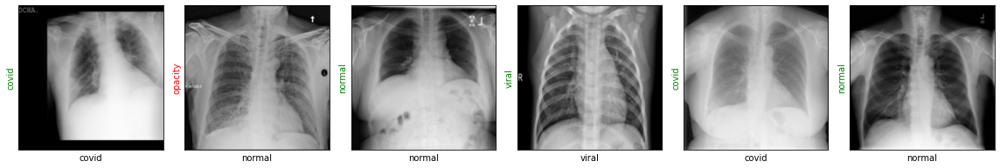

Evaluating at step 1240
Validation Loss: 0.1506, Accuracy: 0.9433


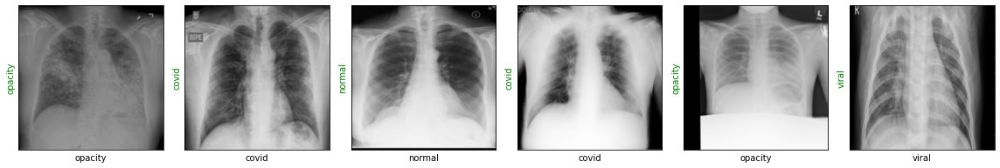

Evaluating at step 1260
Validation Loss: 0.1692, Accuracy: 0.9367


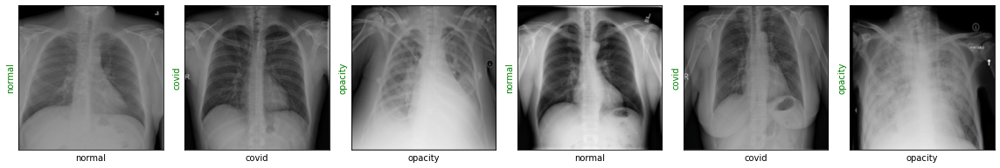

Evaluating at step 1280
Validation Loss: 0.1671, Accuracy: 0.9358


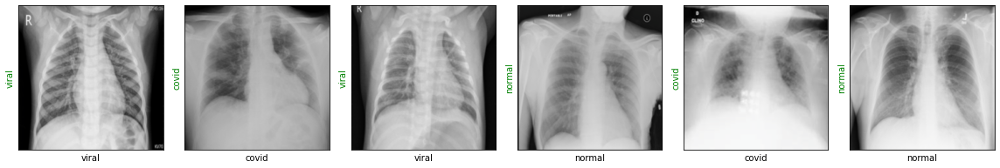

Evaluating at step 1300
Validation Loss: 0.1548, Accuracy: 0.9405


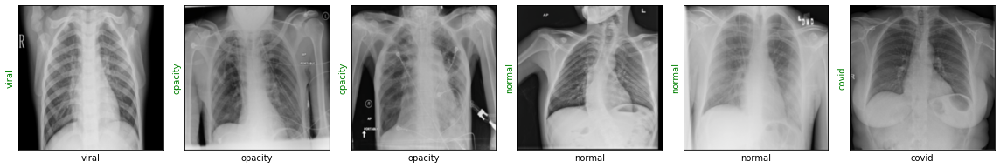

Evaluating at step 1320
Validation Loss: 0.1323, Accuracy: 0.9551


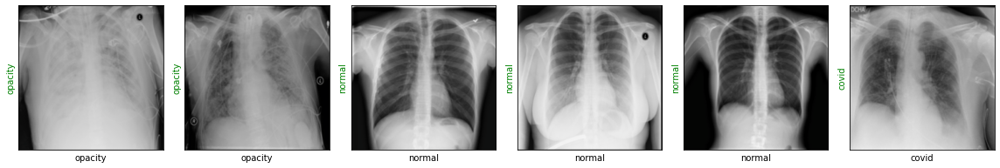

Performance condition satisfied, stopping..
CPU times: user 4h 35min 24s, sys: 5min 8s, total: 4h 40min 32s
Wall time: 4h 39min 40s


In [ ]:
%%time

train(epochs=2)